# Modis preprossesing CDL spatial model

This notebook prepares the Modis data to feed the neural network of the CDL calibrated spatial model. 

The process is the following:
-	1: Merge all the MODIS data
-	2: Clip 
-	3: Calculate max high and width for all clipped files 
-	4: Reshape max dimensions
-	5: Stack 
-   6: Transform to torch tensors




In [1]:
countryKey="US_South_spatial" #reference to model in diccionary of models

import time
import sys, os, imp
import glob
from osgeo import gdal
import time
dirname = os.path.dirname("fieldcrop-detection-south")
filename = os.path.join(dirname, 'pyLib')
sys.path.append(filename)
from modis_lib import modisDataConverter as dataConv
imp.reload(dataConv)
from modis_lib import modelDictionary as modelDictionary
imp.reload(modelDictionary)
modelInfo=modelDictionary.getModelData()[countryKey] 

from modis_lib import anas_functions as aCDL #main library of CDL preprossesing fuctions
imp.reload(aCDL)

C:\Users\Alex\AppData\Local\Temp\ipykernel_17372\1936303774.py:4: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import sys, os, imp


hyyywertuuu  ttttteeettt
hyyywertuuu  ttttteeettt


C:\Users\Alex\anaconda3\envs\tf2.4gpu\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


helo
helo


<module 'modis_lib.anas_functions' from 'pyLib\\modis_lib\\anas_functions.py'>

In [2]:
startyear=2008
endyear=2021

orginal_data="Preprocessing/modis/DataOrg"
converted_data="Preprocessing/modis/DataConverted"
merged_data="Preprocessing/modis/DataMerged"

clipped_Files="Preprocessing/modis/DataClipped"
reshaped_Files="Preprocessing/modis/DataReshaped"
stacked_Files="Preprocessing/modis/DataStacked"

shapefiles=modelInfo["shapefilesAB"]


countryCode=modelInfo["countryCode"]
img_height=modelInfo["imgHeight"]
img_width=modelInfo["imgWidth"]

## 1: Merge all the MODIS data

In [3]:
dirname = os.path.dirname("fieldcrop-detection-south")
filename = os.path.join(dirname, 'pyLib')
sys.path.append(filename)
from modis_lib import modisDataConverter as dataConv
imp.reload(dataConv)

print("check directory...")
dataConv.checkDirectory(converted_data)
dataConv.checkDirectory(merged_data)

print("convert files...")
convFiles=dataConv.getHDFFilesFromPeriod(startyear,endyear,orginal_data)#find MODIS files to merge in time selection
print("files to covert:", len(convFiles))
for file in convFiles:
    dataConv.convertHDFtoTifFromFilePath(file,converted_data)#intermidiate transformation step
time.sleep(1.0)

print ("merge files...")
modisFiles=dataConv.selectModisFiles(converted_data)#selct files to merge
time.sleep(1.0)
for modisCode in modisFiles:
    filesToMerge=dataConv.getMergeFilesFromCode(modisCode,converted_data) 
    print(filesToMerge)
    dataConv.merge_tif(filesToMerge,merged_data,countryCode)#merge
time.sleep(1.0)  

#Comment out if the NDVI images should not be deleted
print ("clear unused data...")
dataConv.checkDirectory(converted_data)
time.sleep(1.0)

check directory...
convert files...
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2008*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2009*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2010*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2011*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2012*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2013*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2014*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2015*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2016*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2017*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2018*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2019*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2020*.hdf
Preprocessing/MODIS/DataOrg/*MOD13Q1.A2021*.hdf
files to covert: 644
Preprocessing/MODIS/DataConverted/MOD13Q1.A2008001.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2008001.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2008017.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2008017.h10v05.tif
Preprocessing/MODIS/Dat

Preprocessing/MODIS/DataConverted/MOD13Q1.A2010225.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010241.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010241.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010257.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010257.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010273.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010273.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010289.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010289.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010305.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010305.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010321.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010321.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010337.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010337.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2010353.h09v05.tif
Preproce

Preprocessing/MODIS/DataConverted/MOD13Q1.A2013193.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013193.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013209.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013209.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013225.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013225.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013241.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013241.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013257.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013257.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013273.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013273.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013289.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013289.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013305.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2013305.h10v05.tif
Preproce

Preprocessing/MODIS/DataConverted/MOD13Q1.A2016145.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016161.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016161.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016177.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016177.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016193.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016193.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016209.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016209.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016225.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016225.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016241.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016241.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016257.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016257.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2016273.h09v05.tif
Preproce

Preprocessing/MODIS/DataConverted/MOD13Q1.A2019113.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019113.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019129.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019129.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019145.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019145.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019161.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019161.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019177.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019177.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019193.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019193.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019209.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019209.h10v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019225.h09v05.tif
Preprocessing/MODIS/DataConverted/MOD13Q1.A2019225.h10v05.tif
Preproce

['Preprocessing/MODIS/DataConverted/MOD13Q1.A2008065.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2008065.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2008081.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2008081.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2008097.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2008097.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2008113.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2008113.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2008129.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2008129.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2008145.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2008145.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2008161.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2008161.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2008177.h09v05.tif', 'Preprocessing/MO

['Preprocessing/MODIS/DataConverted/MOD13Q1.A2010337.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2010337.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2010353.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2010353.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2011001.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2011001.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2011017.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2011017.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2011033.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2011033.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2011049.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2011049.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2011065.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2011065.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2011081.h09v05.tif', 'Preprocessing/MO

['Preprocessing/MODIS/DataConverted/MOD13Q1.A2013241.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2013241.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2013257.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2013257.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2013273.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2013273.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2013289.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2013289.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2013305.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2013305.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2013321.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2013321.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2013337.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2013337.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2013353.h09v05.tif', 'Preprocessing/MO

['Preprocessing/MODIS/DataConverted/MOD13Q1.A2016145.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2016145.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2016161.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2016161.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2016177.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2016177.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2016193.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2016193.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2016209.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2016209.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2016225.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2016225.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2016241.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2016241.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2016257.h09v05.tif', 'Preprocessing/MO

['Preprocessing/MODIS/DataConverted/MOD13Q1.A2019049.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2019049.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2019065.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2019065.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2019081.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2019081.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2019097.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2019097.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2019113.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2019113.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2019129.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2019129.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2019145.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2019145.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2019161.h09v05.tif', 'Preprocessing/MO

['Preprocessing/MODIS/DataConverted/MOD13Q1.A2021321.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2021321.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2021337.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2021337.h10v05.tif']
['Preprocessing/MODIS/DataConverted/MOD13Q1.A2021353.h09v05.tif', 'Preprocessing/MODIS/DataConverted/MOD13Q1.A2021353.h10v05.tif']
clear unused data...


## 2: Clip data

In [6]:
clipped_Files

'Preprocessing/modis/DataClipped'

In [7]:
#A
print("start clipping shapes...")
filesToClip = dataConv.getFilesToClip(startyear,merged_data)
print("filesToClip:"+str(len(filesToClip)))
#print(shapefiles)
#print(filesToClip)
for rasterFile in filesToClip:
    dataConv.clipData(shapefiles,rasterFile,clipped_Files,countryCode)

    
#dataConv.getMaxFileSizeAuto(clipped_Files)

start clipping shapes...
filesToClip:322
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2157.tif
Preprocessing/

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US897.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US24

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008017.US930.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008033.US957.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008049.US988.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008065.US276

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008081.US909.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US2566

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008097.US948.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008113.US979.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008129.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008145.US901.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US2538.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008161.US936.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008177.US971.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008193.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US2150.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008209.US900.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US2538.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008225.US936.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008241.US965.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008257.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US2140.tif
P

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008273.US897.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008289.US921.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008305.US957.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008321.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US1817.tif
Prepro

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008337.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2008353.US912.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US256

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009001.US945.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009017.US979.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009033.US276

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009049.US912.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US2566

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009065.US945.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009081.US985.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009097.US275

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009113.US910.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US2566

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009129.US946.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009145.US972.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009161.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2147.ti

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009177.US894.tif
Pr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US245

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009193.US930.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009209.US965.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009225.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US2154

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009241.US902.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US2543.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009257.US939.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009273.US971.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009289.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US2151.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009305.US903.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US2556.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009321.US939.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009337.US966.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2009353.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US1802.tif
Preproc

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010001.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010017.US921.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010033.US959.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010049.US991.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010065.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010081.US920.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010097.US959.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010113.US988.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010129.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010145.US916.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010161.US952.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010177.US990.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010193.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010209.US925.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010225.US960.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010241.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US2138.tif
Pre

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010257.US897.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010273.US920.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010289.US960.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010305.US986.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010321.US276

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010337.US913.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US256

Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2010353.US947.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011001.US978.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011017.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011033.US911.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US2565.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011049.US948.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011065.US974.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011081.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011097.US909.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US2565.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011113.US943.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011129.US976.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011145.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011161.US903.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US2549.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011177.US934.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011193.US962.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011209.US984.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011225.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011241.US906.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US2549.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011257.US936.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011273.US972.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011289.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2143.tif

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011305.US893.tif
P

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011321.US918.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011337.US948.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2011353.US981.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012001.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012017.US906.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US2549.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012033.US937.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012049.US975.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012065.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012081.US906.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US2559.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012097.US937.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012113.US969.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012129.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US2142.tif


Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012145.US897.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US246.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012161.US927.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012177.US962.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012193.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US2150.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012209.US902.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US2556.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012225.US934.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012241.US962.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012257.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US2138.tif
Pre

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012273.US897.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US2528.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012289.US930.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012305.US961.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012321.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US1817.tif
Prepro

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012337.US892.tif


Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2012353.US932.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013001.US960.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013017.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US2147.ti

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013033.US901.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US2528.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013049.US931.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013065.US955.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013081.US988.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013097.US276

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013113.US908.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US2559.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013129.US935.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013145.US962.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013161.US990.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013177.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013193.US910.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US2566

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013209.US945.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013225.US985.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013241.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013257.US904.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US2559.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013273.US936.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013289.US966.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013305.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US2142.tif


Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013321.US899.tif
Preproc

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US2531.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013337.US934.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2013353.US969.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014001.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US2140.tif
P

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014017.US897.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US245

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014033.US934.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014049.US966.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014065.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014081.US908.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US2566

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014097.US945.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014113.US979.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014129.US273

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014145.US908.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US2561.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014161.US945.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014177.US976.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014193.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US21

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014209.US897.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US24

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014225.US928.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014241.US962.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014257.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2136.tif
Prep

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014273.US890.ti

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014289.US920.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014305.US947.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014321.US982.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014337.US276

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2014353.US918.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015001.US947.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015017.US980.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015033.US275

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015049.US901.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US2535.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015065.US933.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015081.US962.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015097.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US1819.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015113.US894.tif
Pr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015129.US922.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015145.US961.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015161.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US1819.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015177.US892.tif


Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015193.US921.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015209.US952.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015225.US987.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015241.US275

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015257.US910.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US2565.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015273.US941.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015289.US969.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015305.US273

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015321.US898.tif
Prepro

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US245

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015337.US928.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2015353.US962.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016001.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2142.tif


Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016017.US889.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016033.US920.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016049.US955.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016065.US989.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016081.US888.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016097.US918.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016113.US952.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016129.US989.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016145.US888.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016161.US928.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016177.US965.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016193.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US2138.tif
Pre

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016209.US894.tif
Pr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016225.US922.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016241.US952.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016257.US982.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016273.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016289.US902.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US2535.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016305.US940.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016321.US971.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016337.US273

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2016353.US907.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US2564.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017001.US941.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017017.US971.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US273

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017033.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US215

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017049.US906.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US2543.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017065.US935.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017081.US961.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017097.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US1819.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017113.US894.tif
Pr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US246.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017129.US929.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017145.US957.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017161.US990.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017177.US887

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017193.US923.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017209.US952.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017225.US985.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017241.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017257.US919.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017273.US949.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017289.US983.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017305.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017321.US910.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US256

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017337.US946.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2017353.US989.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018001.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018017.US915.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018033.US944.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018049.US974.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018065.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018081.US911.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US2561.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018097.US938.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018113.US970.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018129.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US2147.ti

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018145.US900.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US250.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018161.US933.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018177.US961.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018193.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2150.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018209.US892.tif


Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018225.US925.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018241.US959.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018257.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US2147.ti

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018273.US901.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US2535.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018289.US930.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018305.US959.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018321.US988.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018337.US276

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2018353.US921.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019001.US956.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019017.US990.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019033.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019049.US909.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US2561.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019065.US937.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019081.US973.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019097.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US2136.tif
Prep

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019113.US891.tif

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019129.US921.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019145.US953.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019161.US983.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019177.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019193.US905.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US2549.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019209.US936.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019225.US975.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019241.US274

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019257.US908.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US2561.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019273.US937.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019289.US967.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019305.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019321.US897.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US245

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019337.US927.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2019353.US958.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020001.US991.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020017.US889.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020033.US931.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020049.US963.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020065.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US1802.tif
Preproc

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020081.US888.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020097.US929.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020113.US958.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020129.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US2138.tif
Pre

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020145.US892.tif


Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020161.US930.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020177.US957.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020193.US987.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020209.US275

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020225.US908.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US2561.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020241.US938.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020257.US967.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020273.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US2140.tif
P

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020289.US897.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020305.US930.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US948.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US949.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US950.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020321.US959.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2667.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US987.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020337.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US2142.tif


Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2020353.US897.tif
Prepr

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US24

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021001.US933.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021017.US971.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021033.US273

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021049.US900.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2205.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US246.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US918.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US919.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US920.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021065.US928.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2570.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2574.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2575.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2577.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2580.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US951.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US952.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US953.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US954.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021081.US966.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021097.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021113.US908.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US2566

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021129.US939.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2582.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021145.US970.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2717.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US272.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021161.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US215

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US893.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US894.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US895.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US896.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US897.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US898.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US899.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US900.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US901.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021177.US906.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2209.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2210.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2211.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US241.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US243.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US245.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US246.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US250.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US2556.t

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US921.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US922.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US923.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US924.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US925.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US926.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US927.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US928.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021193.US936.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2584.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2585.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2587.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US955.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US956.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US957.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US958.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US959.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US960.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021209.US970.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2674.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2678.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2679.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2682.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2686.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2691.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2694.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2695.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2697.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2699.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2703.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2705.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2706.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2711.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2714.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US988.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US989.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US990.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021225.US991.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US1802.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US1817.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US1819.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2136.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2138.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2139.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2140.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2142.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2143.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2147.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2151.

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2770.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2775.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2777.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US2778.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US278.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US291.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US887.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US888.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US889.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US890.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US891.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US892.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021241.US893.tif
P

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2171.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2172.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2176.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2178.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2181.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2186.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2193.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2194.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2199.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2203.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2204.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US917.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021257.US918.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2569.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US944.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US945.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US946.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US947.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021273.US948.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2625.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2629.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2630.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2632.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2636.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2640.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2643.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2645.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2653.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2658.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2661.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2664.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US976.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US977.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US978.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US979.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US980.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US981.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US982.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US983.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US984.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US985.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US986.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021289.US987.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2723.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2726.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US273.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2734.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2735.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2737.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2742.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2743.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2745.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2747.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2749.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2750.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2752.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2768.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US2769.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021305.US27

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2150.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2151.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2154.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2156.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2157.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2158.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2159.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2160.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2161.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2162.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2163.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2164.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2167.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2168.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2170.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US902.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US903.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US904.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US905.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US906.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US907.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US908.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US909.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US910.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US911.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US912.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US913.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US914.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US915.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US916.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021321.US917.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2528.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2531.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2532.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2535.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2538.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2543.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2549.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2556.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2559.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2561.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2564.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2565.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2566.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2567.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2568.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US2

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US929.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US930.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US931.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US932.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US933.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US934.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US935.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US936.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US937.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US938.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US939.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US940.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US941.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US942.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US943.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021337.US944.tif
Preproce

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2589.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2591.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2594.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2602.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2603.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2604.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2609.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2611.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2613.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2616.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2617.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US262.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2621.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2622.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US2624.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US26

Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US961.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US962.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US963.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US964.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US965.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US966.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US967.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US968.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US969.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US970.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US971.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US972.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US973.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US974.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US975.tif
Preprocessing/modis/DataClipped/MOD13Q1.US.A2021353.US976.tif
Preproce

## 3: Calculate max high and width for A and B clipped files


In [4]:
#A
#dataConv.getMaxFileSize(clipped_Files)

We find :

**max. height: 544**


**max. width: 993**



## 4: Reshape A and B into this max dimensions

In [3]:
modelInfo=modelDictionary.getModelData()[countryKey]
img_height= 544
img_width= 993
#name = modelInfo["shapefilesA"]

print(img_height, img_width)

544 993


In [4]:
#A
print("reshape A files...")    

#The fuction reshapeClippedFilesCompressed takes a directory with files to reshape, adestination folder to save the output
# and the x, y sizes of the new shape
dataConv.reshapeClippedFilesCompressed(clipped_Files,reshaped_Files,startyear,img_height,img_width) 

reshape A files...
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MO

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US979.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008017.US963.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008033.US943.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008049.US916.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008065.US894.tif 

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008081.US986.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008097.US964.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008113.US945.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008129.US920.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008145.US902.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008161.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2136.ti

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008177.US975.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008193.US953.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008209.US932.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US2535

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008225.US903.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008241.US984.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008257.US953.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008273.US907.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008289.US987.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008305.US941.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US255

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008321.US910.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008337.US990.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008353.US970.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009001.US935.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009017.US917.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009033.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2140

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009049.US967.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009065.US935.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US255

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US902.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009081.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009097.US972.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009113.US928.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US2543

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009129.US912.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009145.US990.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009161.US951.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009177.US913.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US88

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009193.US987.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009209.US960.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009225.US930.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US2535

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009241.US900.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009257.US982.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009273.US938.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US2531

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009289.US906.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009305.US977.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009321.US949.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009337.US929.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US2532

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2009353.US903.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010001.US972.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010017.US941.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010033.US910.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010049.US971.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010065.US931.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US255

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010081.US915.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US894.tif 

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010097.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US1819.tif

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010113.US965.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010129.US946.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010145.US930.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US890.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010161.US991.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010177.US972.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010193.US943.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US2538

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US897.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010209.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US214

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010225.US954.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010241.US922.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010257.US990.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010273.US974.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010289.US940.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US2532

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010305.US909.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010321.US991.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010337.US959.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2010353.US926.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011001.US900.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011017.US981.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011033.US951.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011049.US930.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US2549

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011065.US911.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US891.t

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011081.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US21

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011097.US964.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011113.US943.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US2538

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011129.US905.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011145.US986.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011161.US939.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011177.US903.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011193.US984.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011209.US963.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011225.US939.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011241.US924.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US24

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011257.US903.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011273.US987.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011289.US951.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011305.US932.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011321.US901.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011337.US982.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2011353.US964.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012001.US938.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012017.US920.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012033.US903.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012049.US970.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012065.US939.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012081.US909.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012097.US973.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012113.US938.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US255

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012129.US907.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012145.US978.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012161.US942.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012177.US923.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US24

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012193.US904.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US8

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012209.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2139.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012225.US969.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012241.US935.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US25

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012257.US913.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012273.US893.tif

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012289.US984.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012305.US952.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012321.US934.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US890.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012337.US989.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2012353.US971.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013001.US925.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US2531

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013017.US909.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013033.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2136.ti

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013049.US961.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013065.US929.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US2528

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US894.tif 

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013081.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US1817.tif 

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013097.US972.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013113.US945.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013129.US911.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013145.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US1802.tif -

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013161.US963.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013177.US946.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013193.US930.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013209.US983.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013225.US965.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013241.US943.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013257.US927.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US250

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US892.ti

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013273.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US1802.tif -

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013289.US976.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013305.US946.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013321.US915.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013337.US900.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2013353.US980.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014001.US933.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014017.US918.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014033.US983.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014049.US950.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014065.US918.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014081.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US1817.tif 

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014097.US960.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014113.US942.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US2538

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014129.US898.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014145.US989.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014161.US965.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014177.US933.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014193.US915.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014209.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US1819.tif

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014225.US976.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014241.US941.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014257.US913.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014273.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2138.t

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014289.US978.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014305.US953.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014321.US929.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014337.US895.tif -

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2014353.US989.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015001.US973.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015017.US957.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015033.US937.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US2531

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015049.US906.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015065.US973.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015081.US950.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015097.US932.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015113.US917.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015129.US896.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015145.US985.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015161.US953.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015177.US931.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US2532

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015193.US896.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015209.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US1819.tif

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015225.US963.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015241.US945.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015257.US924.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015273.US890.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015289.US985.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015305.US968.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015321.US944.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US2543

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015337.US911.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2015353.US987.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016001.US958.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016017.US935.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US890.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016033.US988.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016049.US947.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016065.US919.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US889

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016081.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016097.US969.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016113.US927.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016129.US981.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016145.US935.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US250

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US893.tif

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016161.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2136.ti

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016177.US951.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016193.US910.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016209.US982.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016225.US956.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016241.US924.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US24

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016257.US899.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016273.US961.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016289.US941.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US2535

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016305.US910.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016321.US990.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016337.US953.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2016353.US925.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017001.US898.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017017.US969.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017033.US948.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017049.US904.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017065.US961.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017081.US941.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017097.US916.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US890.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017113.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2139.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017129.US959.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017145.US914.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017161.US982.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017177.US955.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017193.US924.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US2531

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US896.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017209.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2136.ti

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017225.US952.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017241.US920.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017257.US979.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017273.US934.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US890.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017289.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017305.US958.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017321.US926.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US2528

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US893.tif

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017337.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US1819.tif

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2017353.US965.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018001.US922.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018017.US977.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018033.US931.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US88

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018049.US989.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018065.US972.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018081.US929.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US900.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018097.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US21

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018113.US971.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018129.US939.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US2531

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US894.tif 

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018145.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US1802.tif -

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018161.US963.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018177.US931.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US255

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US900.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018193.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US214

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018209.US976.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018225.US946.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018241.US929.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US2538

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018257.US911.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US894.tif 

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018273.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2140

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018289.US968.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018305.US922.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US24

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018321.US906.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018337.US963.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2018353.US933.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US2549

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019001.US899.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019017.US971.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019033.US939.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US2535

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US900.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019049.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US214

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019065.US971.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019081.US925.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019097.US987.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019113.US955.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019129.US912.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019145.US969.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019161.US928.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019177.US983.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019193.US938.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US2528

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019209.US908.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019225.US966.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019241.US935.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019257.US905.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019273.US977.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019289.US949.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019305.US904.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019321.US973.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019337.US929.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2019353.US983.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020001.US941.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US2532

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US896.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020017.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2138.t

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020033.US966.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020049.US924.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020065.US979.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020081.US934.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US903.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020097.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020113.US969.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020129.US951.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020145.US921.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020161.US976.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020177.US946.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US25

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US901.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020193.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US214

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020209.US968.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020225.US923.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US24

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US895.tif -

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020241.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2139.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020257.US965.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020273.US919.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US984.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020289.US985.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2640.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2643.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US2645.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US942.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US943.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020305.US944.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US255

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020321.US913.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020337.US972.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2020353.US929.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US8

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021001.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US214

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021017.US956.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2549.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2556.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2559.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2561.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2564.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2565.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US901.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021033.US910.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US968.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021049.US969.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021065.US936.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2193.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2194.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2199.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021081.US890.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021097.US959.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2604.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2609.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US2611.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US925.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021113.US930.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US2543

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US898.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US899.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US900.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US901.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021129.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2139.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2140.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2142.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2143.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US955.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US956.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021145.US959.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2566.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2567.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2568.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2569.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2570.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2574.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US913.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021161.US921.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2768.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2769.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2770.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2775.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2777.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US980.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US981.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US982.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US983.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021177.US984.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US2636.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US940.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US941.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021193.US942.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US2531.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US2532.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US2535.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US2538.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US2543.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US2549

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US902.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US903.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US904.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US905.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US906.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US907.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US908.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US909.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US910.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US911.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US912.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021209.US913.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2147.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2150.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2151.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2154.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2156.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2157.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2158.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2159.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2160.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2161.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2162.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2723.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2726.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US2

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021225.US968.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US2613.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US2616.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US2617.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US262.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US2621.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US2622.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US2624.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US2625.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US2629.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US2630.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US2632.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US937.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US938.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US939.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021241.US940.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US2528.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US2531

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US895.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US896.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US897.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US898.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021257.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2138.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2139.

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2653.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2658.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2661.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2664.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2667.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2674.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2678.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2679.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2682.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2686.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US2691.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US944.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US945.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US946.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US947.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US948.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US949.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US950.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US951.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US952.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US953.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US954.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021273.US955.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US2603.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US926.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US927.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US928.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US929.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US930.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US931.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US932.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US933.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US934.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US935.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US936.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021289.US937.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US2203.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US2204.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US2205.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US2209.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US2210.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US2211.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US241.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US243.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US245.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US246.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US250.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US2528

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US2778.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US278.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US291.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US887.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US888.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US889.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US890.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US891.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US892.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US893.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US894.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US895.tif -

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US985.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US986.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US987.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US988.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US989.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US990.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021305.US991.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US1802.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US1817.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US1819.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2136.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2138.t

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2694.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2695.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2697.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2699.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2703.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2705.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2706.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2711.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2714.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US2717.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US272.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US957.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US958.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US959.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US960.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US961.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US962.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US963.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US964.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US965.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US966.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US967.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021321.US968.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2575.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2577.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2580.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2582.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2584.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2585.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2587.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2589.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2591.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2594.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US2602.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US914.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US915.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US916.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US917.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US918.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US919.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US920.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US921.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US922.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US923.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US924.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021337.US925.tif --

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2163.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2164.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2167.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2168.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2170.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2171.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2172.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2176.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2178.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2181.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2186.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.U

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US273.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2734.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2735.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2737.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2742.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2743.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2745.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2747.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2749.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2750.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US2752.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US

(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US969.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US970.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US971.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US972.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US973.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US974.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US975.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US976.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US977.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US978.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US979.tif -- -- -- 
(544, 993)
Preprocessing/modis/DataReshaped/MOD13Q1.US.A2021353.US980.tif --

## 5.Stacking the data
Here the clipped, reshaped data is packed into data cubes. If the data cubes do not consist of 23 images as standard, then the getYearDate function can be given an additional attribute that specifies how many fewer images (subtracted at the end) are used.

In [5]:
#startyear=2008
selectedYear=startyear
print("start packing datacubes from "+str(startyear) +"-"+str(endyear))


start packing datacubes from 2008-2021


In [6]:
#A
countyIDs=dataConv.getCountyIDs(reshaped_Files)#Create a list of all County ID's represented in this folder
selectedYear=startyear
while selectedYear < endyear+1:
    print(selectedYear)
    
    for id in countyIDs:
        filesToStack=dataConv.getYearData(id,selectedYear,countryCode,reshaped_Files,0)#find for each countie on each year all images 
        dataConv.stackFilesCompressed(stacked_Files,filesToStack)#stack them
    selectedYear+=1
    
print("DataCubes finished!")

2008
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US1802.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US1817.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US1819.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2136.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2138.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2139.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2140.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2142.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2143.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2147.tif
NumberRasterbands:15
FilesToStack:23
Preproces

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2625.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2629.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2630.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2632.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2636.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2640.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2643.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2645.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2653.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US2658.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US921.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US922.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US923.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US924.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US925.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US926.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US927.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US928.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US929.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2008.US930.tif
NumberRasterbands:15
FilesToStack:23
Preprocessing/modis/Data

Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2157.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2158.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2159.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2160.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2161.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2162.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2163.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2164.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2167.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2168.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacke

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2678.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2679.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2682.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2686.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2691.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2694.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2695.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2697.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2699.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US2703.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US935.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US936.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US937.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US938.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US939.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US940.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US941.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US942.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US943.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2009.US944.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2178.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2181.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2186.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2193.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2194.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2199.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2203.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2204.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2205.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2209.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2717.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US272.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2723.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2726.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US273.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2734.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2735.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2737.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2742.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US2743.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/mo

Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US949.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US950.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US951.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US952.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US953.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US954.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US955.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US956.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US957.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2010.US958.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.

Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US245.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US246.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US250.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2528.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2531.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2532.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2535.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2538.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2543.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2549.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/M

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2752.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2768.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2769.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2770.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2775.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2777.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US2778.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US278.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US291.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US887.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/mod

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US964.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US965.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US966.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US967.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US968.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US969.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US970.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US971.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US972.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2011.US973.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US2566.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US2567.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US2568.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US2569.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US2570.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US2574.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US2575.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US2577.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US2580.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US2582.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US893.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US894.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US895.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US896.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US897.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US898.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US899.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US900.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US901.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US902.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US979.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US980.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US981.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US982.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US983.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US984.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US985.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US986.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US987.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2012.US988.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US2594.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US2602.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US2603.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US2604.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US2609.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US2611.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US2613.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US2616.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US2617.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US262.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/m

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US908.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US909.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US910.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US911.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US912.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US913.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US914.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US915.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US916.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2013.US917.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US1819.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2136.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2138.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2139.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2140.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2142.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2143.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2147.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2150.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2151.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2630.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2632.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2636.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2640.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2643.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2645.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2653.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2658.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2661.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US2664.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US923.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US924.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US925.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US926.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US927.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US928.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US929.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US930.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US931.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2014.US932.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2160.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2161.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2162.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2163.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2164.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2167.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2168.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2170.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2171.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2172.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2686.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2691.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2694.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2695.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2697.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2699.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2703.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2705.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2706.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US2711.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US939.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US940.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US941.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US942.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US943.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US944.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US945.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US946.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US947.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2015.US948.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2194.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2199.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2203.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2204.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2205.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2209.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2210.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2211.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US241.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US243.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/mo

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US273.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2734.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2735.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2737.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2742.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2743.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2745.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2747.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2749.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US2750.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/m

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US954.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US955.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US956.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US957.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US958.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US959.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US960.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US961.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US962.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2016.US963.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2532.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2535.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2538.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2543.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2549.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2556.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2559.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2561.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2564.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2565.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2777.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US2778.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US278.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US291.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US887.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US888.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US889.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US890.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US891.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US892.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Da

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US969.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US970.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US971.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US972.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US973.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US974.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US975.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US976.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US977.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2017.US978.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US2574.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US2575.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US2577.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US2580.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US2582.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US2584.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US2585.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US2587.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US2589.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US2591.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US898.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US899.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US900.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US901.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US902.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US903.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US904.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US905.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US906.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US907.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US984.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US985.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US986.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US987.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US988.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US989.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US990.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2018.US991.tif
NumberRasterbands:23
2019
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US1802.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US1817.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/mod

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US2611.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US2613.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US2616.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US2617.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US262.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US2621.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US2622.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US2624.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US2625.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US2629.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/m

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US913.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US914.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US915.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US916.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US917.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US918.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US919.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US920.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US921.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2019.US922.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2142.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2143.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2147.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2150.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2151.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2154.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2156.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2157.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2158.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2159.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2645.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2653.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2658.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2661.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2664.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2667.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2674.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2678.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2679.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US2682.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US928.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US929.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US930.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US931.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US932.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US933.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US934.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US935.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US936.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2020.US937.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2167.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2168.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2170.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2171.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2172.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2176.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2178.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2181.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2186.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2193.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2699.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2703.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2705.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2706.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2711.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2714.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2717.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US272.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2723.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US2726.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/m

FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US944.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US945.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US946.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US947.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US948.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US949.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US950.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US951.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US952.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/DataStacked/MOD13Q1.US.A2021.US953.tif
NumberRasterbands:23
FilesToStack:23
Preprocessing/modis/Data

## 6. Transform to torch tensors

To save time and computer power during training, we want to save the data in the correct format to directly feed the model. So, in this step we are changeing the order of dimension to fit the convetion of pytorch (N,Chanels,Depth,Hight,Width). And also saving the result as a ".pt" file (pytorch tensor).

In [3]:
import torch
import torchvision 
from torch.utils.data import Dataset 
from torch.utils.data import DataLoader
import numpy as np 
import torch 
import os, sys, imp
import torch.nn as nn
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F
from skimage import io
dirname = os.path.dirname("fieldcrop-detection-south")
filename = os.path.join(dirname, 'pyLib')
sys.path.append(filename)
from modis_lib import anas_functions as aCDL #main library of CDL preprossesing fuctions
imp.reload(aCDL)

helo


<module 'modis_lib.anas_functions' from 'pyLib\\modis_lib\\anas_functions.py'>

In [4]:
stacked_Files ="Preprocessing/modis/DataStacked"
out_f = "Preprocessing/modis/modis_TorchPoints"
aCDL.MODIS_points2(stacked_Files, out_f)
#MODIS_points(stacked_Files, out_f)

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US1802.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2156.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2735.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2737.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US2777.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2008.US991.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US1802.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2154.pt
Preprocessing/modis/modis_TorchPoin

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2735.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2737.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2009.US2777.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US1802.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2156.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2737.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2010.US2778.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2156.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2157.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US2778.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2011.US278.pt
Preprocessing/modis/modis_TorchPoin

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2156.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2157.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2158.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US2778.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2012.US278.pt
Preprocessing/modis/modis_TorchPoin

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2156.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2157.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2737.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2013.US2778.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US1802.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2156.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2737.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2014.US2778.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US1802.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2156.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2735.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2737.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2015.US2777.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US1802.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2156.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2737.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2016.US2778.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2156.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2157.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2737.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US2778.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2156.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2157.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US2778.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2018.US278.pt
Preprocessing/modis/modis_TorchPoin

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US1817.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2156.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2157.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US2778.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2019.US278.pt
Preprocessing/modis/modis_TorchPoin

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2156.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2157.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2158.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US2778.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2020.US278.pt
Preprocessing/modis/modis_TorchPoin

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US1819.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2136.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2138.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2139.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2140.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2142.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2143.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2147.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2150.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2151.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2154.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2156.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2157.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2158.pt
Preprocessing/modis/modis_TorchPoi

Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2742.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2743.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2745.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2747.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2749.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2750.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2752.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2768.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2769.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2770.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2775.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2777.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2778.pt
Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US278.pt
Preprocessing/modis/modis_TorchPoin

In [20]:
a = torch.ones(3, 2, 2)
a

tensor([[[1., 1.],
         [1., 1.]],

        [[1., 1.],
         [1., 1.]],

        [[1., 1.],
         [1., 1.]]])

In [21]:
a[0,1] = float('nan')
a

tensor([[[1., 1.],
         [nan, nan]],

        [[1., 1.],
         [1., 1.]],

        [[1., 1.],
         [1., 1.]]])

In [30]:
a.sum(dim = [1, 2])

SyntaxError: invalid syntax (1042517602.py, line 1)

In [28]:
a.nansum(dim = [1, ])

tensor([[1., 1.],
        [2., 2.],
        [2., 2.]])

In [1]:
100000000*0.0001

10000.0

In [2]:
20000000*0.0001

2000.0

In [ ]:
modis = io.imread(file)

In [6]:
import numpy as np
np.random.seed(0)
r = np.random.rand(5,5)
r

array([[0.5488135 , 0.71518937, 0.60276338, 0.54488318, 0.4236548 ],
       [0.64589411, 0.43758721, 0.891773  , 0.96366276, 0.38344152],
       [0.79172504, 0.52889492, 0.56804456, 0.92559664, 0.07103606],
       [0.0871293 , 0.0202184 , 0.83261985, 0.77815675, 0.87001215],
       [0.97861834, 0.79915856, 0.46147936, 0.78052918, 0.11827443]])

In [9]:
print(r.max(), r.min())

0.978618342232764 0.02021839744032572


In [15]:
resc = (r-r.min())/(r.max() -r.min())
resc

array([[0.55153917, 0.7251367 , 0.60783077, 0.54743825, 0.42094786],
       [0.65283363, 0.43548501, 0.90938507, 0.98439526, 0.37898909],
       [0.80499445, 0.530756  , 0.57160496, 0.94467685, 0.05302344],
       [0.06981522, 0.        , 0.84766433, 0.79083723, 0.88667967],
       [1.        , 0.81275064, 0.46041422, 0.79331263, 0.10231222]])

In [16]:
print(resc.max(), resc.min())

1.0 0.0


In [19]:
def normalization_min_max(array, a_min = -20000000, a_max=100000000):
    """
    Takes an array and normalize its values to give an output 
    with elements between 0 and 1. 
    """
    array_resc = (array-a_min)/(a_max -a_min)
    
    return array_resc

    
    
    

In [19]:
normalization_min_max(r, r.min(), r.max())

array([[0.55153917, 0.7251367 , 0.60783077, 0.54743825, 0.42094786],
       [0.65283363, 0.43548501, 0.90938507, 0.98439526, 0.37898909],
       [0.80499445, 0.530756  , 0.57160496, 0.94467685, 0.05302344],
       [0.06981522, 0.        , 0.84766433, 0.79083723, 0.88667967],
       [1.        , 0.81275064, 0.46041422, 0.79331263, 0.10231222]])

In [10]:
from matplotlib import pyplot as plt

In [11]:
import torch
mod = 'Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2021.US2711.pt'
mod = "Preprocessing/modis/modis_TorchPoints/MODIS_torch.US.A2017.US948.pt"
a = torch.load(mod)
#print(a)
na = a.numpy()
print(na.shape)
na = na[0, 0, :, :]
print(na.shape)
modis = na

(1, 23, 544, 993)
(544, 993)


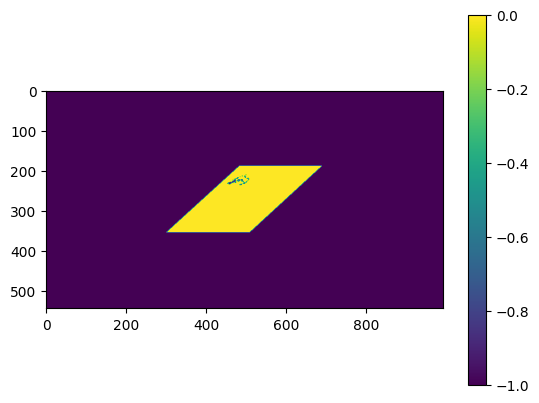

In [12]:
#modis[modis == -1.0] = np.nan
#modis = normalization_min_max(na)

plt.imshow(modis)
plt.colorbar()
plt.show()

In [27]:
1e-9+1.666666600e-1

0.166666661

In [14]:
#clipped file
from skimage import io
im = io.imread("Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US889.tif")

In [15]:
im.shape

(111, 294)

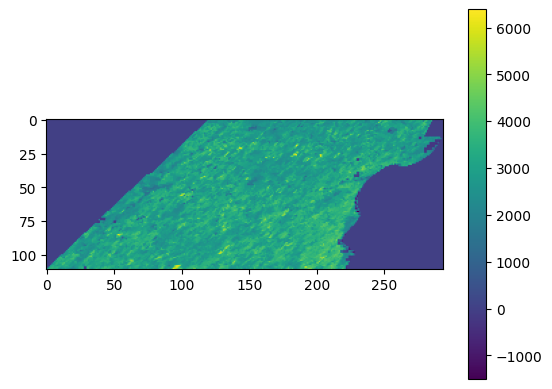

In [16]:
plt.imshow(im)
plt.colorbar()
plt.show()

In [17]:
im_resc= normalization_min_max(im)
plt.imshow(im_resc)
plt.colorbar()
plt.show()

NameError: name 'normalization_min_max' is not defined

In [18]:
im

array([[  -1,   -1,   -1, ...,   -1,   -1,   -1],
       [  -1,   -1,   -1, ...,   -1,   -1,   -1],
       [  -1,   -1,   -1, ...,   -1,   -1,   -1],
       ...,
       [  -1,   -1,   -1, ...,   -1,   -1,   -1],
       [  -1,   -1, 3123, ...,   -1,   -1,   -1],
       [  -1, 3463, 3592, ...,   -1,   -1,   -1]], dtype=int16)

In [54]:
im_resc

array([[0.16666666, 0.16666666, 0.16666666, ..., 0.16666666, 0.16666666,
        0.16666666],
       [0.16666666, 0.16666666, 0.16666666, ..., 0.16666666, 0.16666666,
        0.16666666],
       [0.16666666, 0.16666666, 0.16666666, ..., 0.16666666, 0.16666666,
        0.16666666],
       ...,
       [0.16666666, 0.16666666, 0.16666666, ..., 0.16666666, 0.16666666,
        0.16666666],
       [0.16666666, 0.16666666, 0.16669269, ..., 0.16666666, 0.16666666,
        0.16666666],
       [0.16666666, 0.16669553, 0.1666966 , ..., 0.16666666, 0.16666666,
        0.16666666]])

In [56]:
print(im_resc.max(), im_resc.min())

0.16671990833333333 0.16665414166666667


In [ ]:


a = np.random.rand(10)            # Generate random data.
a = np.where(a > 0.8, np.nan, a)  # Set all data larger than 0.8 to NaN

a = np.ma.array(a, mask=np.isnan(a)) # Use a mask to mark the NaNs

a_norm  = a / np.sum(a) # The sum function ignores the masked values.

In [46]:
im_resc2 = np.where(im == -1, np.nan, im)

im_resc2 = np.ma.array(im_resc2, mask=np.isnan(im_resc2))

im_resc2 = normalization_min_max(im_resc2)

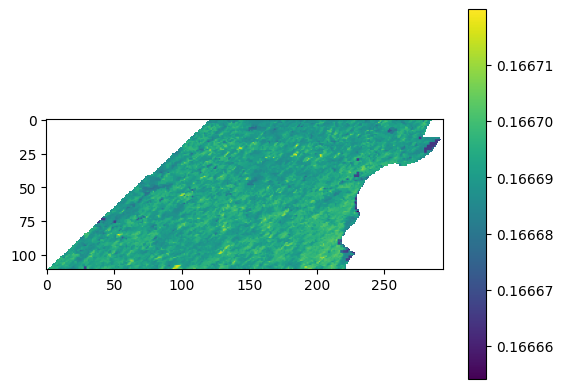

In [47]:
plt.imshow(im_resc2)
plt.colorbar()
plt.show()

In [59]:
im_resc2

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        ...,
        [--, --, --, ..., --, --, --],
        [--, --, 0.16669269166666667, ..., --, --, --],
        [--, 0.166695525, 0.1666966, ..., --, --, --]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True, False, ...,  True,  True,  True],
        [ True, False, False, ...,  True,  True,  True]],
  fill_value=1e+20)

In [58]:
#pip list

In [81]:
im = io.imread("Preprocessing/modis/DataClipped/MOD13Q1.US.A2008001.US957.tif")
#filenameIndex=filePath.find("MOD13Q1")
#fileName=filePath[filenameIndex:]

def padding(array, xx, yy):
    """
	:param array: numpy array
	:param xx: desired height
	:param yy: desirex width
	:return: padded array
	"""

    h = array.shape[0]
    w = array.shape[1]

    a = (xx - h) // 2
    aa = xx - a - h

    b = (yy - w) // 2
    bb = yy - b - w

    return np.pad(array, pad_width=((a, aa), (b, bb)), mode='constant',constant_values=(-1))

im=padding(im,500,600)
#im = normalization_min_max(im)
print(im.shape, type(im))

(500, 600) <class 'numpy.ndarray'>


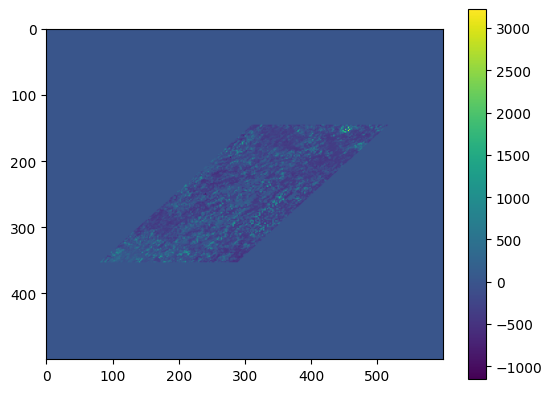

In [82]:
plt.imshow(im)
plt.colorbar()
plt.show()

In [83]:
rescaled = normalization_min_max(im)
#now transfer -1 from im
#output = torch.where(targets == -1, targets, output) #transfer -1 pixels from target to output
rescaled = np.where(im == -1, im, rescaled)

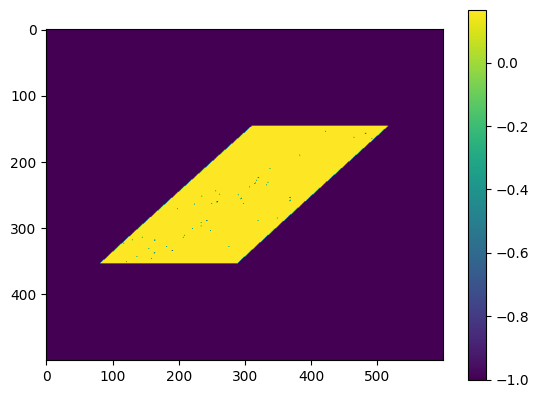

In [84]:
plt.imshow(rescaled)
plt.colorbar()
plt.show()

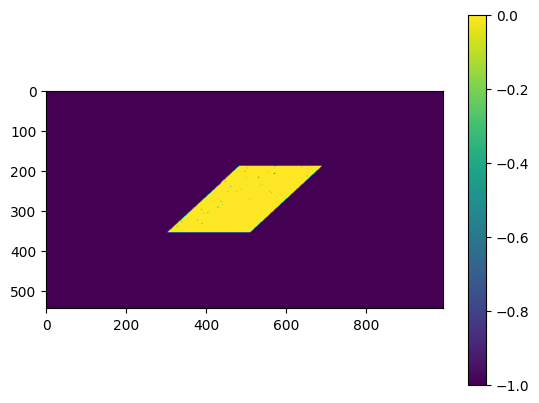

In [21]:
#after all of this:

im = io.imread("Preprocessing/modis/DataReshaped/MOD13Q1.US.A2008001.US901.tif")
plt.imshow(im)
plt.colorbar()
plt.show()